# Object Detection


In [ ]:
#@title Imports and function definitions

# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.9.2
The following GPU devices are available: /device:GPU:0


In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=500)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

## Apply module

Load a public image from Open Images v4, save locally, and display.

Image downloaded to /tmp/tmpx6mk_3vk.jpg.


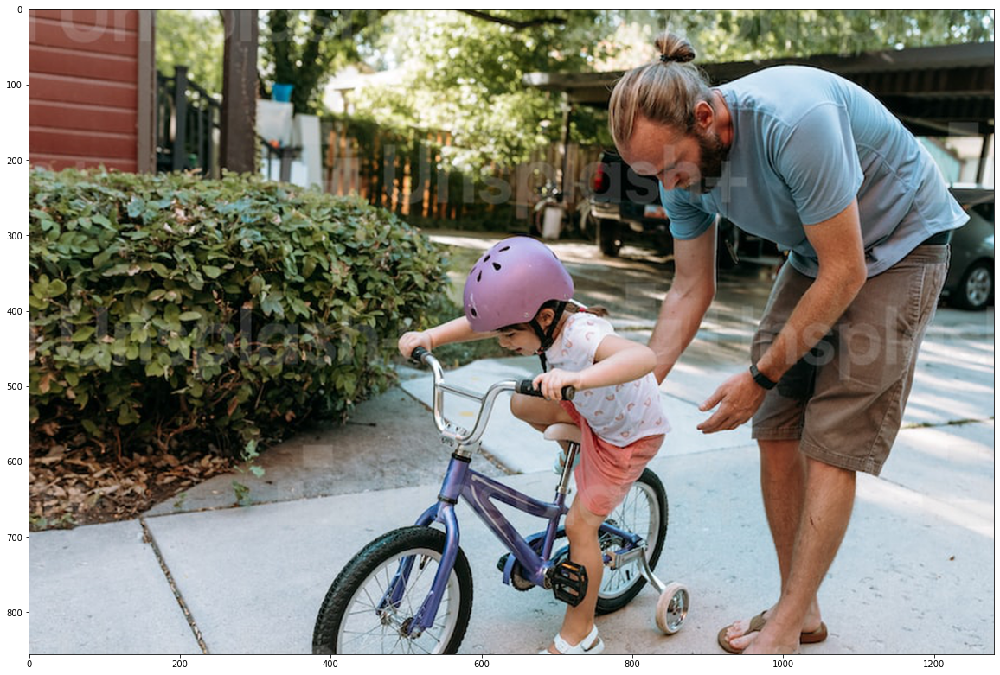

In [ ]:
# By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
image_url = "https://plus.unsplash.com/premium_photo-1664279990791-a108ff138aa4?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=869&q=80" #@param
#"https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"  
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

In [ ]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" #@param ["https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1", "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"]

detector = hub.load(module_handle).signatures['default']

In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [ ]:

def run_detector(detector, path):

  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  ### mine
  ma= 0
  md=0
  res = result["detection_class_entities"].copy()
  for i in range(len(res)):
    a = res[i].decode("utf-8")
    #print(a , i)
    if a =="Person":
      if result['detection_scores'][i] > md:
        md = result['detection_scores'][i]
        person_index = i
    if a == 'Bicycle':
      if result['detection_scores'][i] > ma:
        ma = result['detection_scores'][i]
        bicycle_index = i

  res1 = {}
  for i in result.keys():
    res1[i] = []
  for i in result.keys():
    for j in [bicycle_index,  person_index]:
      res1[i].append(result[i][j])
    res1[i] = np.array(res1[i])



  image_with_boxes = draw_boxes(
      img.numpy(), res1["detection_boxes"],
      res1["detection_class_entities"], res1["detection_scores"])

  print(res1["detection_boxes"])
  display_image(image_with_boxes)

Found 100 objects.
Inference time:  48.63146471977234
[[0.53478056 0.30068052 1.         0.68722373]
 [0.36885542 0.3858801  0.92214733 0.6651596 ]]


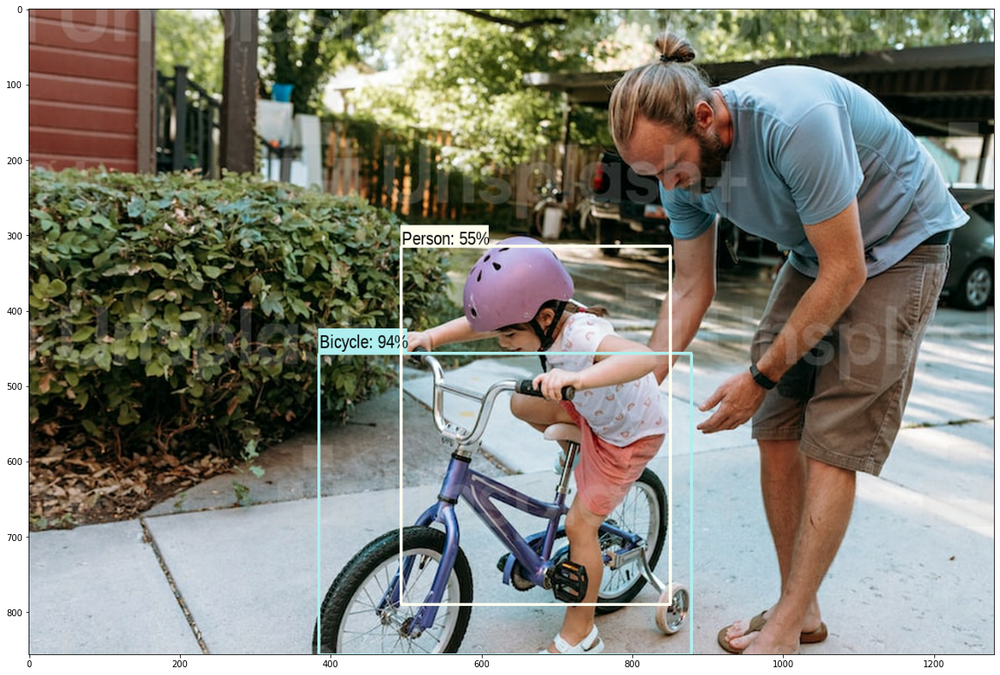

In [ ]:
run_detector(detector, downloaded_image_path)

#Pymaf

In [ ]:
pwd

'/content'

In [ ]:
# set up code and data for demo
!git clone https://github.com/HongwenZhang/PyMAF.git
%cd PyMAF
!wget --no-check-certificate "https://onedrive.live.com/download?cid=DF2414B28D1B6A99&resid=DF2414B28D1B6A99%21862&authkey=AJqiZVYmJa6jgoU" -O pymaf_data_for_demo.zip
!rm -rf data flashmob.mp4
!unzip pymaf_data_for_demo.zip
!rm -rf pymaf_data_for_demo.zip
!wget https://download.pytorch.org/models/resnet50-19c8e357.pth -O data/pretrained_model/resnet50-19c8e357.pth

In [ ]:
# PyTorch tested on version 1.9.0
!pip3 install -U torch==1.9.0+cu111 torchvision==0.10.0+cu111 torchaudio==0.9.0 -f https://download.pytorch.org/whl/torch_stable.html
# pytorch3d
!pip3 install -U "git+https://github.com/facebookresearch/pytorch3d.git@stable"
# other packages
!pip3 install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████████████                   | 834.1 MB 1.3 MB/s eta 0:15:36tcmalloc: large alloc 1147494400 bytes == 0x396b0000 @  0x7f3895511615 0x58ead6 0x4f355e 0x4d222f 0x51041f 0x5b4ee6 0x58ff2e 0x510325 0x5b4ee6 0x58ff2e 0x50d482 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4bac0a 0x538a76 0x590ae5 0x510280 0x5b4ee6 0x58ff2e 0x50d482 0x5b4ee6 0x58ff2e 0x50c4fc 0x58fd37 0x50ca37 0x5b4ee6 0x58ff2e
     |████████████████▌               | 1055.7 MB 1.3 MB/s eta 0:12:39tcmalloc: large alloc 1434370048 bytes == 0x7dd06000 @  0x7f3895511615 0x58ead6 0x4f355e 0x4d222f 0x51041f 0x5b4ee6 0x58ff2e 0x510325 0x5b4ee6 0x58ff2e 0x50d482 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4bac0a 0x538a76 0x590ae5 0x510280 0x5b4ee6 0x58ff2e 0x50d482 0x5b4ee6 0x58ff2e 0x50c4fc 0x58fd37 0x50ca37 0x5b4ee6 0x58ff2e
     |█████

## For Image as Input

In [ ]:
cd PyMAF

/content/PyMAF


In [ ]:
!pip3 install pyglet==1.5.27

In [ ]:
!python3 demo.py --checkpoint=data/pretrained_model/PyMAF_model_checkpoint.pt --img_file examples/COCO_val2014_000000019667.jpg

Traceback (most recent call last):
  File "demo.py", line 28, in <module>
    from multi_person_tracker import MPT
ModuleNotFoundError: No module named 'multi_person_tracker'


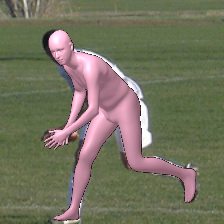

In [ ]:
# Display the generated image
from IPython.display import Image
Image(filename='output/examples/COCO_val2014_000000019667_smpl.png')

Here we express our sincere gratitude towards the original authors for their awesome, elegant codebase [VIBE](https://github.com/mkocabas/VIBE). 

Making it open-sourced is admirable and truly appreciated.

## For Video as Input

In [ ]:
# There are two sample videos. Just un-/comment to switch to each of them (use pyrender for visualization)
# video with a single person.
!CUDA_VISIBLE_DEVICES=0 python3 demo.py --checkpoint=data/pretrained_model/PyMAF_model_checkpoint.pt --vid_file ./sample_video.mp4
# video with multiple people. It takes longer time to run.
# !CUDA_VISIBLE_DEVICES=0 python3 demo.py --checkpoint=data/pretrained_model/PyMAF_model_checkpoint.pt --vid_file ./flashmob.mp4

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:OpenGL.acceleratesupport:No OpenGL_accelerate module loaded: No module named 'OpenGL_accelerate'
Traceback (most recent call last):
  File "demo.py", line 39, in <module>
    from utils.renderer import PyRenderer
  File "/content/PyMAF/utils/renderer.py", line 17, in <module>
    import pyrender
  File "/usr/local/lib/python3.7/dist-packages/pyrender/__init__.py", line 12, in <module>
    from .viewer import Viewer
  File "/usr/local/lib/python3.7/dist-packages/pyrender/viewer.py", line 33, in <module>
    import pyglet
  File "/usr/local/lib/python3.7/dist-packages/pyglet/__init__.py", line 54, in <module>
    raise Exception(f"pyglet {version} requires Python {MIN_PYTHON_VERSION_STR} or newer.")
Exception: pyglet 2.0.0 requires Python 3.8 or newer.


In [ ]:
# Play the generated video
from IPython.display import HTML
from base64 import b64encode

def video(path):
  mp4 = open(path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML('<video width=500 controls loop> <source src="%s" type="video/mp4"></video>' % data_url)

video('output/sample_video/sample_video_result.mp4')
# video('output/flashmob/flashmob_result.mp4')